# CREDIT SCORE

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv(r'credit_score.csv')
df.head()

,CUST_ID,INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,...,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,CREDIT_SCORE,DEFAULT
0,C02COQEVYU,33269,0,532304,0.0000,16.0000,1.2000,1889,945,0.5003,...,0.0000,0.0625,High,1,0,0,0,0,444,1
1,C02OZKC0ZF,77158,91187,315648,1.1818,4.0909,3.4615,5818,111,0.0191,...,0.7692,0.2222,No,1,0,0,1,0,625,0
2,C03FHP2D0A,30917,21642,534864,0.7000,17.3000,24.7142,1157,860,0.7433,...,1.4286,0.0578,High,1,0,0,1,0,469,1
3,C03PVPPHOY,80657,64526,629125,0.8000,7.8000,9.7499,6857,3686,0.5376,...,1.2500,0.1282,High,1,0,0,1,0,559,0
4,C04J69MUX0,149971,1172498,2399531,7.8182,16.0000,2.0465,1978,322,0.1628,...,0.1163,0.0568,High,1,1,1,1,1,473,0


In [3]:
df.shape

(1000, 87)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 87 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CUST_ID                  1000 non-null   object 
 1   INCOME                   1000 non-null   int64  
 2   SAVINGS                  1000 non-null   int64  
 3   DEBT                     1000 non-null   int64  
 4   R_SAVINGS_INCOME         1000 non-null   float64
 5   R_DEBT_INCOME            1000 non-null   float64
 6   R_DEBT_SAVINGS           1000 non-null   float64
 7   T_CLOTHING_12            1000 non-null   int64  
 8   T_CLOTHING_6             1000 non-null   int64  
 9   R_CLOTHING               1000 non-null   float64
 10  R_CLOTHING_INCOME        1000 non-null   float64
 11  R_CLOTHING_SAVINGS       1000 non-null   float64
 12  R_CLOTHING_DEBT          1000 non-null   float64
 13  T_EDUCATION_12           1000 non-null   int64  
 14  T_EDUCATION_6            

In [5]:
df = df.drop('CUST_ID',axis=1)
df.head()

,INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,R_CLOTHING_INCOME,...,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,CREDIT_SCORE,DEFAULT
0,33269,0,532304,0.0000,16.0000,1.2000,1889,945,0.5003,0.0568,...,0.0000,0.0625,High,1,0,0,0,0,444,1
1,77158,91187,315648,1.1818,4.0909,3.4615,5818,111,0.0191,0.0754,...,0.7692,0.2222,No,1,0,0,1,0,625,0
2,30917,21642,534864,0.7000,17.3000,24.7142,1157,860,0.7433,0.0374,...,1.4286,0.0578,High,1,0,0,1,0,469,1
3,80657,64526,629125,0.8000,7.8000,9.7499,6857,3686,0.5376,0.0850,...,1.2500,0.1282,High,1,0,0,1,0,559,0
4,149971,1172498,2399531,7.8182,16.0000,2.0465,1978,322,0.1628,0.0132,...,0.1163,0.0568,High,1,1,1,1,1,473,0


In [6]:
df.select_dtypes(include='object')['CAT_GAMBLING'].unique()

array(['High', 'No', 'Low'], dtype=object)

In [7]:
df['CAT_GAMBLING'] = df['CAT_GAMBLING'].replace({'High':2,'Low':1,'No':0})
df.head()

,INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,R_CLOTHING_INCOME,...,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,CREDIT_SCORE,DEFAULT
0,33269,0,532304,0.0000,16.0000,1.2000,1889,945,0.5003,0.0568,...,0.0000,0.0625,2,1,0,0,0,0,444,1
1,77158,91187,315648,1.1818,4.0909,3.4615,5818,111,0.0191,0.0754,...,0.7692,0.2222,0,1,0,0,1,0,625,0
2,30917,21642,534864,0.7000,17.3000,24.7142,1157,860,0.7433,0.0374,...,1.4286,0.0578,2,1,0,0,1,0,469,1
3,80657,64526,629125,0.8000,7.8000,9.7499,6857,3686,0.5376,0.0850,...,1.2500,0.1282,2,1,0,0,1,0,559,0
4,149971,1172498,2399531,7.8182,16.0000,2.0465,1978,322,0.1628,0.0132,...,0.1163,0.0568,2,1,1,1,1,1,473,0


In [8]:
df.nunique()

INCOME                 951
SAVINGS                992
DEBT                   943
R_SAVINGS_INCOME       463
R_DEBT_INCOME          545
                      ... 
CAT_MORTGAGE             2
CAT_SAVINGS_ACCOUNT      2
CAT_DEPENDENTS           2
CREDIT_SCORE           259
DEFAULT                  2
Length: 86, dtype: int64

In [9]:
cols=[]
for i in df.columns:
    if df[i].nunique()>2:
        cols.append(i)

In [10]:
from sklearn.preprocessing import MinMaxScaler

In [11]:
mmax=MinMaxScaler()

In [12]:
df[cols] = mmax.fit_transform(df[cols])

In [13]:
df.head()

,INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,R_CLOTHING_INCOME,...,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,CREDIT_SCORE,DEFAULT
0,0.050248,0.000000,0.089184,0.000000,0.432425,0.004098,0.043671,0.023674,0.472739,0.215062,...,0.000000,0.006247,1.0,1,0,0,0,0,0.288,1
1,0.116536,0.031316,0.052885,0.073353,0.110563,0.011820,0.134505,0.002781,0.018048,0.289972,...,0.076844,0.022208,0.0,1,0,0,1,0,0.650,0
2,0.046696,0.007432,0.089613,0.043448,0.467560,0.084394,0.026748,0.021544,0.702353,0.136931,...,0.142719,0.005777,1.0,1,0,0,1,0,0.338,1
3,0.121821,0.022160,0.105405,0.049655,0.210807,0.033294,0.158525,0.092339,0.507985,0.328635,...,0.124876,0.012813,1.0,1,0,0,1,0,0.518,0
4,0.226510,0.402662,0.402024,0.485265,0.432425,0.006988,0.045729,0.008067,0.153832,0.039468,...,0.011618,0.005677,1.0,1,1,1,1,1,0.346,0


In [14]:
df.columns

Index(['INCOME', 'SAVINGS', 'DEBT', 'R_SAVINGS_INCOME', 'R_DEBT_INCOME',
       'R_DEBT_SAVINGS', 'T_CLOTHING_12', 'T_CLOTHING_6', 'R_CLOTHING',
       'R_CLOTHING_INCOME', 'R_CLOTHING_SAVINGS', 'R_CLOTHING_DEBT',
       'T_EDUCATION_12', 'T_EDUCATION_6', 'R_EDUCATION', 'R_EDUCATION_INCOME',
       'R_EDUCATION_SAVINGS', 'R_EDUCATION_DEBT', 'T_ENTERTAINMENT_12',
       'T_ENTERTAINMENT_6', 'R_ENTERTAINMENT', 'R_ENTERTAINMENT_INCOME',
       'R_ENTERTAINMENT_SAVINGS', 'R_ENTERTAINMENT_DEBT', 'T_FINES_12',
       'T_FINES_6', 'R_FINES', 'R_FINES_INCOME', 'R_FINES_SAVINGS',
       'R_FINES_DEBT', 'T_GAMBLING_12', 'T_GAMBLING_6', 'R_GAMBLING',
       'R_GAMBLING_INCOME', 'R_GAMBLING_SAVINGS', 'R_GAMBLING_DEBT',
       'T_GROCERIES_12', 'T_GROCERIES_6', 'R_GROCERIES', 'R_GROCERIES_INCOME',
       'R_GROCERIES_SAVINGS', 'R_GROCERIES_DEBT', 'T_HEALTH_12', 'T_HEALTH_6',
       'R_HEALTH', 'R_HEALTH_INCOME', 'R_HEALTH_SAVINGS', 'R_HEALTH_DEBT',
       'T_HOUSING_12', 'T_HOUSING_6', 'R_HOUSING',

In [15]:
cols_ind=['INCOME', 'SAVINGS', 'DEBT', 'R_SAVINGS_INCOME', 'R_DEBT_INCOME',
       'R_DEBT_SAVINGS', 'T_CLOTHING_12', 'T_CLOTHING_6', 'R_CLOTHING',
       'R_CLOTHING_INCOME', 'R_CLOTHING_SAVINGS', 'R_CLOTHING_DEBT',
       'T_EDUCATION_12', 'T_EDUCATION_6', 'R_EDUCATION', 'R_EDUCATION_INCOME',
       'R_EDUCATION_SAVINGS', 'R_EDUCATION_DEBT', 'T_ENTERTAINMENT_12',
       'T_ENTERTAINMENT_6', 'R_ENTERTAINMENT', 'R_ENTERTAINMENT_INCOME',
       'R_ENTERTAINMENT_SAVINGS', 'R_ENTERTAINMENT_DEBT', 'T_FINES_12',
       'T_FINES_6', 'R_FINES', 'R_FINES_INCOME', 'R_FINES_SAVINGS',
       'R_FINES_DEBT', 'T_GAMBLING_12', 'T_GAMBLING_6', 'R_GAMBLING',
       'R_GAMBLING_INCOME', 'R_GAMBLING_SAVINGS', 'R_GAMBLING_DEBT',
       'T_GROCERIES_12', 'T_GROCERIES_6', 'R_GROCERIES', 'R_GROCERIES_INCOME',
       'R_GROCERIES_SAVINGS', 'R_GROCERIES_DEBT', 'T_HEALTH_12', 'T_HEALTH_6',
       'R_HEALTH', 'R_HEALTH_INCOME', 'R_HEALTH_SAVINGS', 'R_HEALTH_DEBT',
       'T_HOUSING_12', 'T_HOUSING_6', 'R_HOUSING', 'R_HOUSING_INCOME',
       'R_HOUSING_SAVINGS', 'R_HOUSING_DEBT', 'T_TAX_12', 'T_TAX_6', 'R_TAX',
       'R_TAX_INCOME', 'R_TAX_SAVINGS', 'R_TAX_DEBT', 'T_TRAVEL_12',
       'T_TRAVEL_6', 'R_TRAVEL', 'R_TRAVEL_INCOME', 'R_TRAVEL_SAVINGS',
       'R_TRAVEL_DEBT', 'T_UTILITIES_12', 'T_UTILITIES_6', 'R_UTILITIES',
       'R_UTILITIES_INCOME', 'R_UTILITIES_SAVINGS', 'R_UTILITIES_DEBT',
       'T_EXPENDITURE_12', 'T_EXPENDITURE_6', 'R_EXPENDITURE',
       'R_EXPENDITURE_INCOME', 'R_EXPENDITURE_SAVINGS', 'R_EXPENDITURE_DEBT',
       'CAT_GAMBLING', 'CAT_DEBT', 'CAT_CREDIT_CARD', 'CAT_MORTGAGE',
       'CAT_SAVINGS_ACCOUNT', 'CAT_DEPENDENTS', 'CREDIT_SCORE']

In [16]:
x=df[cols_ind]
x

,INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,R_CLOTHING_INCOME,...,R_EXPENDITURE_INCOME,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,CREDIT_SCORE
0,0.050248,0.000000,0.089184,0.000000,0.432425,0.004098,0.043671,0.023674,0.472739,0.215062,...,0.249944,0.000000,0.006247,1.0,1,0,0,0,0,0.288
1,0.116536,0.031316,0.052885,0.073353,0.110563,0.011820,0.134505,0.002781,0.018048,0.289972,...,0.181777,0.076844,0.022208,0.0,1,0,0,1,0,0.650
2,0.046696,0.007432,0.089613,0.043448,0.467560,0.084394,0.026748,0.021544,0.702353,0.136931,...,0.249944,0.142719,0.005777,1.0,1,0,0,1,0,0.338
3,0.121821,0.022160,0.105405,0.049655,0.210807,0.033294,0.158525,0.092339,0.507985,0.328635,...,0.249944,0.124876,0.012813,1.0,1,0,0,1,0,0.518
4,0.226510,0.402662,0.402024,0.485265,0.432425,0.006988,0.045729,0.008067,0.153832,0.039468,...,0.181777,0.011618,0.005677,1.0,1,1,1,1,1,0.346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.496745,0.503137,0.921732,0.276491,0.452082,0.012823,0.386106,0.253820,0.573278,0.190898,...,0.181777,0.020390,0.005427,1.0,1,1,1,1,1,0.236
996,0.122949,0.030498,0.114069,0.067711,0.226042,0.026180,0.124841,0.048499,0.338751,0.253323,...,0.181777,0.083248,0.010864,0.0,1,0,0,1,0,0.578
997,0.000000,0.014571,0.005154,0.200972,0.221318,0.002476,0.000000,0.000000,0.829538,0.005236,...,0.300037,0.024975,0.034462,0.0,1,0,0,1,0,0.398
998,0.054390,0.002748,0.101226,0.013792,0.453444,0.257831,0.046076,0.031840,0.602570,0.209021,...,0.333258,0.499525,0.006616,0.0,1,1,0,1,0,0.414


In [17]:
from sklearn.decomposition import PCA

In [18]:
pca = PCA(n_components=15,random_state=42)
pca

PCA(n_components=15, random_state=42)

In [19]:
pca_col=['PC'+str(i) for i in range(1,16)]
pca_col

['PC1',
 'PC2',
 'PC3',
 'PC4',
 'PC5',
 'PC6',
 'PC7',
 'PC8',
 'PC9',
 'PC10',
 'PC11',
 'PC12',
 'PC13',
 'PC14',
 'PC15']

In [20]:
x_pca = pd.DataFrame(pca.fit_transform(x),columns=pca_col)
x_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,-0.631563,-0.517738,-0.563963,0.155580,0.259769,0.090227,-0.065288,-0.232744,-0.014547,-0.340362,-0.302997,0.184898,-0.142114,-0.191977,0.216291
1,-0.553241,0.032521,0.182728,-0.329075,-0.224454,-0.569642,-0.020905,-0.056845,0.130127,-0.340402,0.163942,-0.062018,-0.159676,-0.150241,0.216048
2,-0.647814,-0.505699,-0.553835,0.154702,0.320872,0.198847,-0.077193,-0.199260,-0.072352,-0.258748,-0.227925,0.261892,0.030878,0.016335,0.071172
3,-0.270918,-0.771767,-0.599498,-0.022225,0.042854,-0.009453,-0.147549,-0.173398,0.175375,-0.127885,0.229298,-0.278668,0.279148,0.033060,-0.253787
4,0.958363,0.668384,-1.185980,-0.169815,0.364675,-0.440908,0.393424,0.141361,-0.367256,-0.100948,-0.174721,-0.164729,0.168195,-0.036803,0.199432


In [21]:
from sklearn.cluster import KMeans

In [22]:
max_range=10
wcss=[]
for k in range(2,max_range):
    kmeans = KMeans(n_clusters=k,random_state=42)
    model = kmeans.fit(x_pca)
    wcss.append(model.inertia_)

In [23]:
wcss

[1597.4032620316211,
 1408.1075149521935,
 1266.6763890351194,
 1173.8479807200874,
 1082.422599039578,
 1001.5408962468673,
 924.1327327336661,
 868.8959931477136]

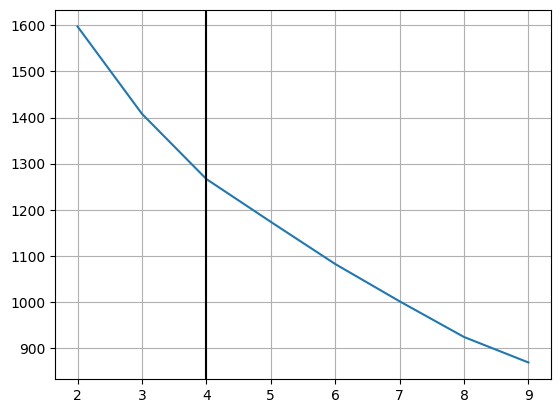

In [24]:
plt.plot(range(2,max_range),wcss)
plt.axvline(4.0,color='k')
plt.grid()
plt.show()

In [25]:
kmeans = KMeans(n_clusters=4,random_state=42)
model = kmeans.fit(x_pca)
model.labels_

array([3, 2, 3, 3, 1, 2, 2, 0, 3, 1, 1, 3, 2, 3, 2, 2, 2, 3, 2, 2, 0, 2,
       2, 3, 2, 3, 2, 1, 2, 2, 2, 1, 2, 1, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2,
       2, 0, 1, 2, 2, 3, 0, 0, 2, 1, 2, 1, 2, 1, 2, 3, 2, 0, 1, 2, 2, 0,
       2, 0, 0, 2, 3, 1, 1, 3, 1, 1, 0, 2, 0, 2, 2, 2, 2, 2, 2, 3, 2, 0,
       2, 0, 0, 1, 1, 2, 2, 3, 2, 1, 0, 3, 2, 0, 2, 0, 0, 0, 2, 1, 2, 2,
       2, 2, 1, 3, 0, 1, 1, 2, 2, 2, 2, 2, 3, 2, 2, 0, 1, 2, 3, 2, 0, 2,
       2, 0, 2, 2, 2, 2, 0, 2, 2, 3, 3, 3, 3, 2, 1, 2, 2, 0, 2, 2, 2, 2,
       2, 2, 0, 2, 2, 0, 2, 0, 3, 0, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2,
       1, 2, 0, 2, 1, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 1, 0, 2, 3, 1, 3, 2,
       1, 2, 3, 2, 2, 0, 1, 1, 0, 2, 1, 2, 0, 2, 2, 0, 2, 3, 0, 2, 2, 2,
       2, 2, 2, 3, 0, 2, 3, 0, 0, 2, 2, 0, 1, 2, 0, 2, 3, 2, 2, 1, 3, 2,
       2, 2, 2, 2, 2, 0, 2, 1, 0, 0, 1, 0, 3, 2, 2, 0, 1, 2, 2, 2, 0, 1,
       1, 2, 2, 3, 2, 0, 2, 2, 0, 2, 2, 3, 2, 2, 3, 2, 0, 1, 2, 1, 2, 3,
       1, 2, 0, 0, 2, 2, 2, 2, 3, 0, 2, 2, 2, 2, 3,

In [26]:
x_pca['clusters'] = pd.Series(model.labels_)
x_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,clusters
0,-0.631563,-0.517738,-0.563963,0.155580,0.259769,0.090227,-0.065288,-0.232744,-0.014547,-0.340362,-0.302997,0.184898,-0.142114,-0.191977,0.216291,3
1,-0.553241,0.032521,0.182728,-0.329075,-0.224454,-0.569642,-0.020905,-0.056845,0.130127,-0.340402,0.163942,-0.062018,-0.159676,-0.150241,0.216048,2
2,-0.647814,-0.505699,-0.553835,0.154702,0.320872,0.198847,-0.077193,-0.199260,-0.072352,-0.258748,-0.227925,0.261892,0.030878,0.016335,0.071172,3
3,-0.270918,-0.771767,-0.599498,-0.022225,0.042854,-0.009453,-0.147549,-0.173398,0.175375,-0.127885,0.229298,-0.278668,0.279148,0.033060,-0.253787,3
4,0.958363,0.668384,-1.185980,-0.169815,0.364675,-0.440908,0.393424,0.141361,-0.367256,-0.100948,-0.174721,-0.164729,0.168195,-0.036803,0.199432,1


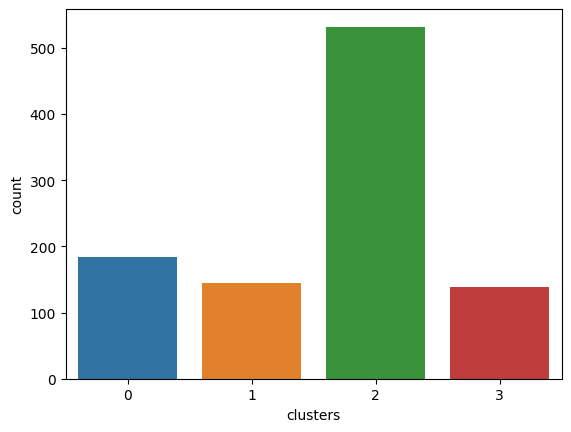

In [27]:
sns.countplot(x='clusters',data=x_pca)
plt.show()

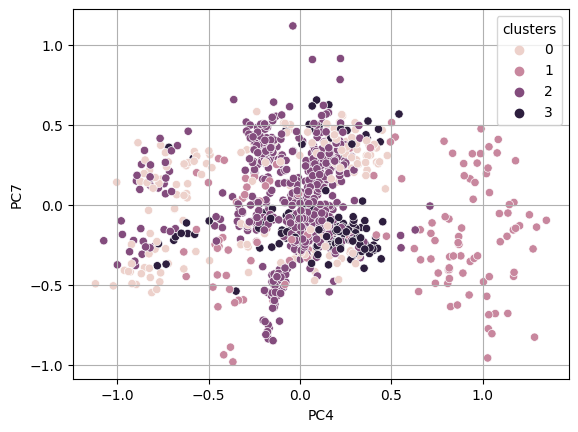

In [28]:
sns.scatterplot(x='PC4',y='PC7',data=x_pca,hue='clusters')
plt.grid()
plt.show()

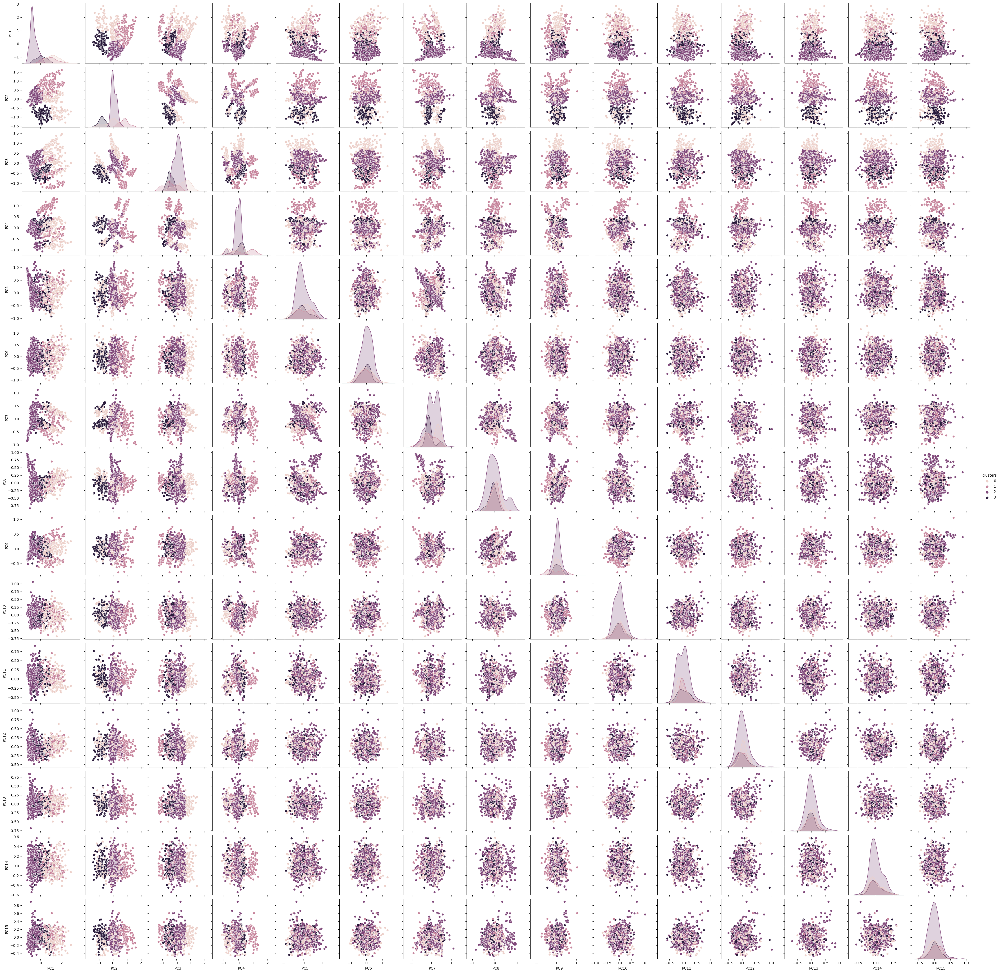

In [29]:
sns.pairplot(x_pca,hue='clusters')
plt.show()

In [30]:
from sklearn.model_selection import train_test_split

In [31]:
y = x_pca['clusters']
x = x_pca.drop('clusters',axis=1)

In [32]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.30,random_state=42)

In [33]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

In [34]:
dt=DecisionTreeClassifier()
dt_model=dt.fit(xtrain,ytrain)
dt_model

DecisionTreeClassifier()

In [35]:
y_pred_train = dt_model.predict(xtrain)
y_pred_test = dt_model.predict(xtest)

In [36]:
accuracy_score(ytrain,y_pred_train),accuracy_score(ytest,y_pred_test)

(1.0, 0.9866666666666667)

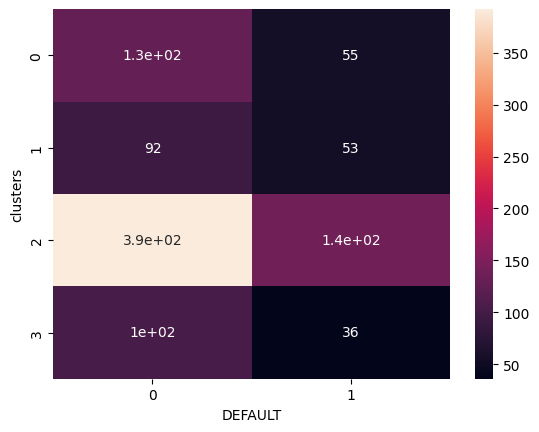

In [37]:
sns.heatmap(pd.crosstab(x_pca['clusters'],df['DEFAULT']),annot=True)
plt.show()

In [38]:
df

,INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,R_CLOTHING_INCOME,...,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,CREDIT_SCORE,DEFAULT
0,0.050248,0.000000,0.089184,0.000000,0.432425,0.004098,0.043671,0.023674,0.472739,0.215062,...,0.000000,0.006247,1.0,1,0,0,0,0,0.288,1
1,0.116536,0.031316,0.052885,0.073353,0.110563,0.011820,0.134505,0.002781,0.018048,0.289972,...,0.076844,0.022208,0.0,1,0,0,1,0,0.650,0
2,0.046696,0.007432,0.089613,0.043448,0.467560,0.084394,0.026748,0.021544,0.702353,0.136931,...,0.142719,0.005777,1.0,1,0,0,1,0,0.338,1
3,0.121821,0.022160,0.105405,0.049655,0.210807,0.033294,0.158525,0.092339,0.507985,0.328635,...,0.124876,0.012813,1.0,1,0,0,1,0,0.518,0
4,0.226510,0.402662,0.402024,0.485265,0.432425,0.006988,0.045729,0.008067,0.153832,0.039468,...,0.011618,0.005677,1.0,1,1,1,1,1,0.346,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.496745,0.503137,0.921732,0.276491,0.452082,0.012823,0.386106,0.253820,0.573278,0.190898,...,0.020390,0.005427,1.0,1,1,1,1,1,0.236,0
996,0.122949,0.030498,0.114069,0.067711,0.226042,0.026180,0.124841,0.048499,0.338751,0.253323,...,0.083248,0.010864,0.0,1,0,0,1,0,0.578,1
997,0.000000,0.014571,0.005154,0.200972,0.221318,0.002476,0.000000,0.000000,0.829538,0.005236,...,0.024975,0.034462,0.0,1,0,0,1,0,0.398,0
998,0.054390,0.002748,0.101226,0.013792,0.453444,0.257831,0.046076,0.031840,0.602570,0.209021,...,0.499525,0.006616,0.0,1,1,0,1,0,0.414,0


In [39]:
import statsmodels.api as sm

In [40]:
y = df['DEFAULT']
x = df.drop('DEFAULT',axis=1)

In [41]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.30,random_state=4)

In [42]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

In [43]:
dt=DecisionTreeClassifier()
rf=RandomForestClassifier()
knn=KNeighborsClassifier()
gnb=GaussianNB()

In [44]:
from sklearn.metrics import accuracy_score,roc_auc_score,roc_curve

In [45]:
def predictor(model_name):    
    print("For the {}".format(model_name)) 
    print("--"*50)
    model_name.fit(xtrain,ytrain)    
    y_pred_train = model_name.predict(xtrain)    
    y_pred_test = model_name.predict(xtest)    
    print("The TRAIN accuracy is",accuracy_score(ytrain,y_pred_train))    
     
    print("--"*50)    
    print("The TEST accuracy is",accuracy_score(ytest,y_pred_test))    
       
    plt.show()

In [46]:
predictor(dt)

For the DecisionTreeClassifier()
----------------------------------------------------------------------------------------------------
The TRAIN accuracy is 1.0
----------------------------------------------------------------------------------------------------
The TEST accuracy is 0.64


In [47]:
predictor(rf)

For the RandomForestClassifier()
----------------------------------------------------------------------------------------------------
The TRAIN accuracy is 1.0
----------------------------------------------------------------------------------------------------
The TEST accuracy is 0.7433333333333333


In [48]:
predictor(knn)

For the KNeighborsClassifier()
----------------------------------------------------------------------------------------------------
The TRAIN accuracy is 0.7585714285714286
----------------------------------------------------------------------------------------------------
The TEST accuracy is 0.7133333333333334


In [49]:
predictor(gnb)

For the GaussianNB()
----------------------------------------------------------------------------------------------------
The TRAIN accuracy is 0.4857142857142857
----------------------------------------------------------------------------------------------------
The TEST accuracy is 0.51


In [50]:
import plotly.express as px

In [51]:
feat = pd.DataFrame({'features':xtrain.columns,'importances':rf.fit(xtrain,ytrain).feature_importances_})
feat

,features,importances
0,INCOME,0.008077
1,SAVINGS,0.012199
2,DEBT,0.014914
3,R_SAVINGS_INCOME,0.014570
4,R_DEBT_INCOME,0.029074
...,...,...
80,CAT_CREDIT_CARD,0.001956
81,CAT_MORTGAGE,0.002585
82,CAT_SAVINGS_ACCOUNT,0.000135
83,CAT_DEPENDENTS,0.000150


In [52]:
feat = feat.sort_values(by='importances',ascending=False)
feat

,features,importances
84,CREDIT_SCORE,0.042561
77,R_EXPENDITURE_DEBT,0.029244
4,R_DEBT_INCOME,0.029074
44,R_HEALTH,0.025185
32,R_GAMBLING,0.024736
...,...,...
28,R_FINES_SAVINGS,0.001603
78,CAT_GAMBLING,0.001291
83,CAT_DEPENDENTS,0.000150
82,CAT_SAVINGS_ACCOUNT,0.000135


In [53]:
px.bar(x='features',y='importances',data_frame=feat,color='importances')